# Aplicación en CPU de los filtros

En esta sección intentamos desarrollar una herramienta sencilla para aplicar, medir y visualizar el efecto de tre filtros de procesamiento de imágenes. Utilizamos librerías estándar de Python como NumPy, SciPy, u OpenCV para realizar los cálculos exclusivos dentro de la CPU. 

El script permite cargar una imagen, aplciar una secuecnia de filtros, medir el tiempo de ejecución de cada uno sobre cada imagen y mostrar los resultados visualmente para compararse. 

### Descripción del Código

Tenemos una construcción modular del código: 

* **Carga y preparación**: una fucnión auxiliar se encarga de leer cada imagen desde nuestra carpeta de imágenes, podemos seleccionar si se leerá en grises o en RGB (si trabajamos en RGB, cada filtro se aplica canal por canal). Después, se convierte en formato de punto flotante y se normalizan sus valores al rango `[0,1]`. 
* **Implementación de los filtros**: contiene la función asociada a cada filtro para la imagen. 
* **Ejecución y métricas**: una función prncipal se encarga de aplicar la cantidad seleccionada de filtros (se pueden elegir todos o solo uno de los filtros), y mide el tiempo que tarda cada operación. 
* **Visualización**: mostramos la imagen original junto a los resultados de procesamiento de cada filtro seleccionado por el usuario, también se genera un gráfico de tiempos de ejecución. 

### Filtros Implementados

Implementamos los siguientes tres filtros clásicos de Visión Computacional:

* **Filtro de Media**: suaviza la imagen, reduciendo el ruido. Realiza una convolución con un kernel promediado, el tamaño del kernel se puede definir por el usuario. 
* **Magnitud del Gradiente**: utilizado para detectar bordes y áreas con cambios bruscos de intensidad. Calcula la diferencia entre píxeles en las direcciones X y Y, para aproximar las derivadas y luego calcular la magnitud dle vector gradiente reusltante. 
* **Filtro Laplaciano**: es un detecto de bordes de segundo orden, su uso común es el de resaltar detalles más finos. Aplica la convolución con el kernel Laplacinao estándar. 



In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import time
from scipy.ndimage import convolve

# ===============================================================
# FUNCIONES AUXILIARES
# ===============================================================

def cargar_preparar_imagen(image_path, modo_color=False):
    """
    Carga una imagen en color o escala de grises y normaliza a [0,1].
    """
    flag = cv2.IMREAD_COLOR if modo_color else cv2.IMREAD_GRAYSCALE
    img = cv2.imread(image_path, flag)

    if img is None:
        raise FileNotFoundError(f"No se pudo cargar la imagen: {image_path}")

    img = img.astype(np.float32) / 255.0
    if modo_color:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convertir BGR → RGB para matplotlib
    return img


# ===============================================================
# FILTROS
# ===============================================================

def aplicar_filtro_media(imagen, tamano_kernel=5):
    kernel = np.ones((tamano_kernel, tamano_kernel)) / (tamano_kernel ** 2)
    if imagen.ndim == 3:
        return np.stack([convolve(imagen[..., c], kernel) for c in range(3)], axis=-1)
    return convolve(imagen, kernel)

def aplicar_magnitud_gradiente(imagen):
    if imagen.ndim == 3:
        grad = [aplicar_magnitud_gradiente(imagen[..., c]) for c in range(3)]
        return np.stack(grad, axis=-1)

    dx = np.diff(imagen, axis=1, append=0)
    dy = np.diff(imagen, axis=0, append=0)
    magnitud = np.sqrt(dx**2 + dy**2)
    return (magnitud - magnitud.min()) / (magnitud.max() - magnitud.min())

def aplicar_filtro_laplaciano(imagen):
    kernel = np.array([[0, 1, 0],
                       [1, -4, 1],
                       [0, 1, 0]])
    if imagen.ndim == 3:
        return np.stack([convolve(imagen[..., c], kernel) for c in range(3)], axis=-1)
    return convolve(imagen, kernel)


# ===============================================================
# FUNCIÓN PRINCIPAL
# ===============================================================

def apply_filters_cpu(image_path, filter_sequence, modo_color=False, **kwargs):
    """
    Aplica cada filtro por separado y mide tiempos de ejecución individuales.
    """
    filtros = {
        'media': aplicar_filtro_media,
        'gradiente': aplicar_magnitud_gradiente,
        'laplaciano': aplicar_filtro_laplaciano
    }

    img_original = cargar_preparar_imagen(image_path, modo_color=modo_color)

    resultados = {}
    tiempos = {}

    for f in filter_sequence:
        if f not in filtros:
            print(f" Filtro '{f}' no reconocido. Se omite.")
            continue

        print(f"-> Aplicando filtro: {f}")
        start = time.perf_counter()

        if f == 'media':
            k = kwargs.get('kernel_size', 5)
            img_out = filtros[f](img_original, tamano_kernel=k)
        else:
            img_out = filtros[f](img_original)

        end = time.perf_counter()
        resultados[f] = img_out
        tiempos[f] = end - start
        print(f"   Tiempo: {tiempos[f]:.6f} s")

    return img_original, resultados, tiempos


# ===============================================================
# VISUALIZACIÓN
# ===============================================================

def mostrar_resultados(img_original, resultados, tiempos):
    filtros = list(resultados.keys())
    n = len(filtros)

    # Configurar grilla
    if n == 1:
        filas, cols = 1, 2
    elif n == 2:
        filas, cols = 1, 3
    else:
        filas, cols = 2, 2

    plt.figure(figsize=(14, 8))

    # Imagen original
    plt.subplot(filas, cols, 1)
    plt.imshow(img_original, cmap='gray' if img_original.ndim == 2 else None)
    plt.title("Imagen Original")
    plt.axis('off')

    # Filtros aplicados
    for i, f in enumerate(filtros, start=2):
        plt.subplot(filas, cols, i)
        plt.imshow(resultados[f], cmap='gray' if resultados[f].ndim == 2 else None)
        plt.title(f"{f.capitalize()} ({tiempos[f]:.4f} s)")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

    # Gráfica de tiempos
    plt.figure(figsize=(6, 4))
    plt.bar(tiempos.keys(), tiempos.values(), color='skyblue')
    plt.title("Tiempos de ejecución por filtro")
    plt.ylabel("Segundos")
    plt.xlabel("Filtro")
    plt.show()


-> Aplicando filtro: media
   Tiempo: 0.903276 s
-> Aplicando filtro: gradiente
   Tiempo: 0.082099 s
-> Aplicando filtro: laplaciano
   Tiempo: 0.030801 s


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


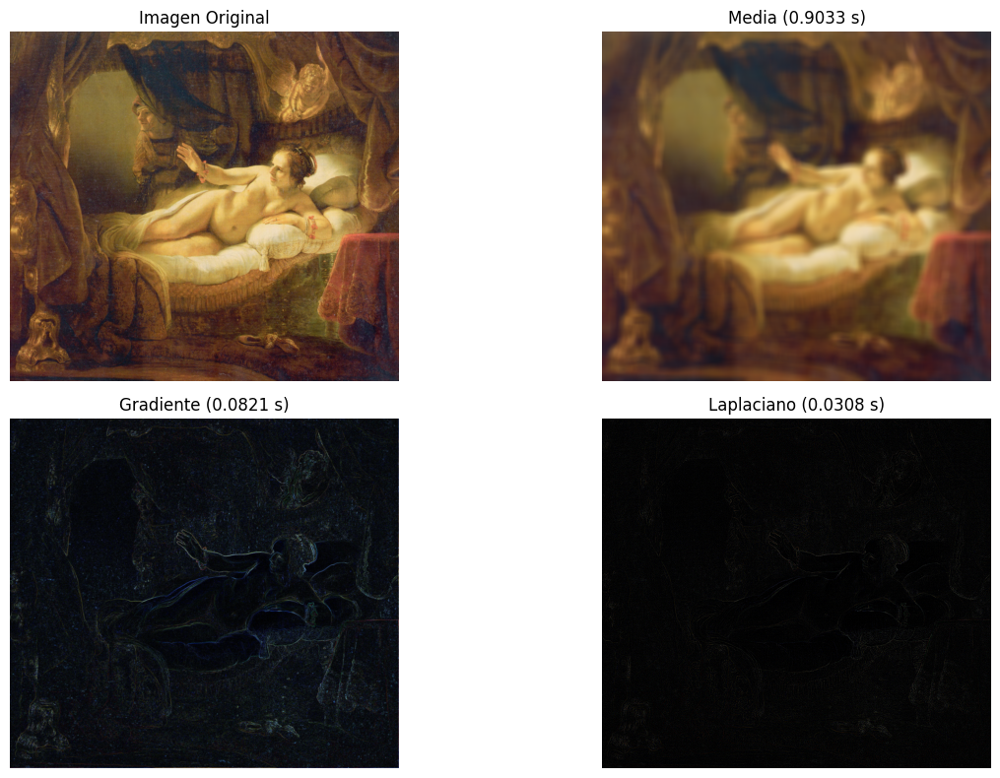

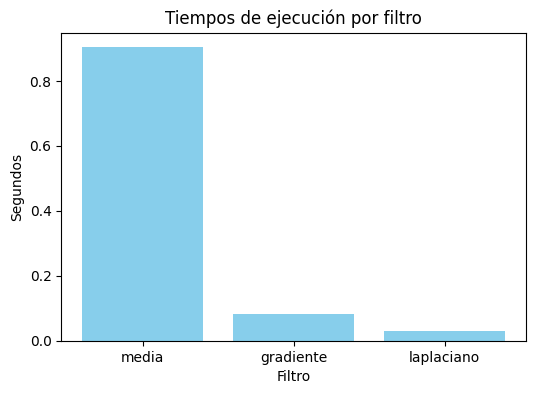

In [47]:
# =========================== #
# Dánae de Rembrant - COLOR = #
# =========================== #

FILENAME = "/home/cesar/Natural-Language-Processing-and-Computer-Vision/Visión-Computacional/Tarea-01-Filtros/imagenes/Danae.png"
FILTROS_A_APLICAR = ['media', 'gradiente', 'laplaciano']
HIPERPARAMETROS = {'kernel_size': 20}

original, resultados, tiempos = apply_filters_cpu(
    image_path=FILENAME,
    filter_sequence=FILTROS_A_APLICAR,
    modo_color=True,  # Cambia a True si quieres mantener el color
    **HIPERPARAMETROS
)

mostrar_resultados(original, resultados, tiempos)

-> Aplicando filtro: media
   Tiempo: 1.572785 s
-> Aplicando filtro: gradiente
   Tiempo: 0.124633 s
-> Aplicando filtro: laplaciano
   Tiempo: 0.051228 s


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


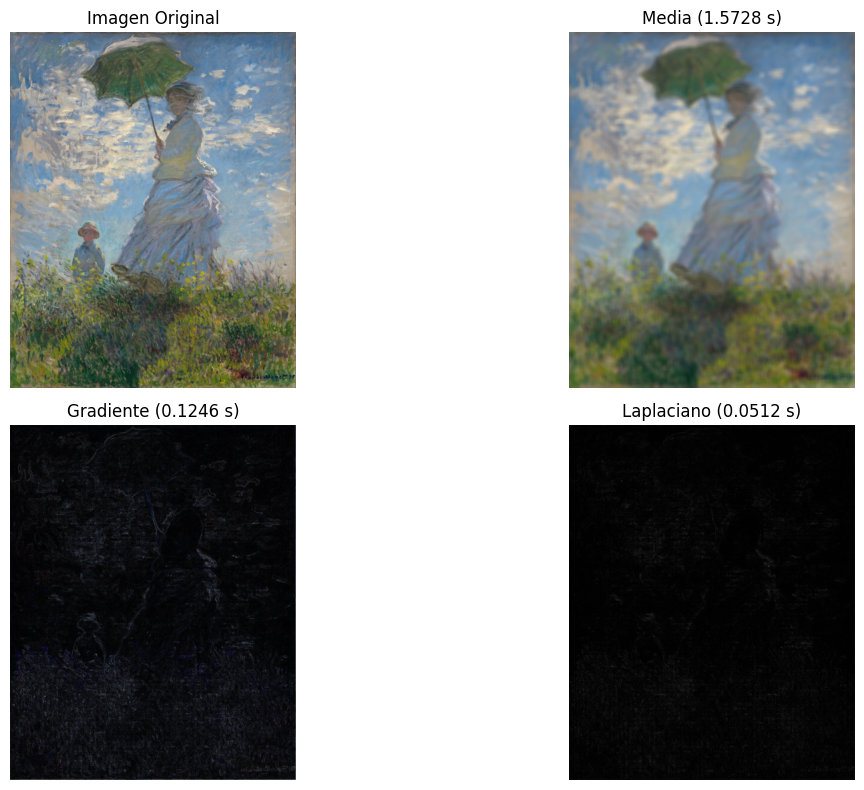

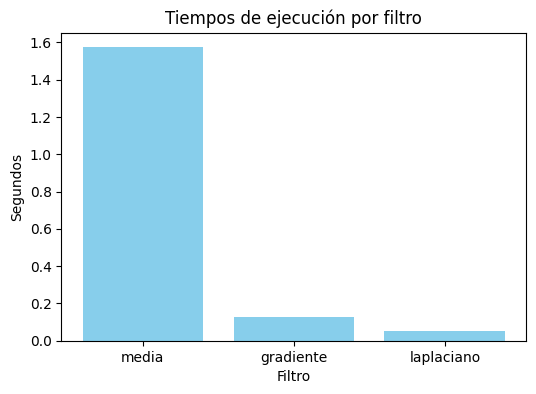

In [37]:
# ============================================================================================ #
# Woman with a Parasol – Madame Monet and Her Son (1875) – Claude Monet - COLOR = #
# ============================================================================================ #

FILENAME = "/home/cesar/Natural-Language-Processing-and-Computer-Vision/Visión-Computacional/Tarea-01-Filtros/imagenes/Monet.jpg"
FILTROS_A_APLICAR = ['media', 'gradiente', 'laplaciano']
HIPERPARAMETROS = {'kernel_size': 20}

original, resultados, tiempos = apply_filters_cpu(
    image_path=FILENAME,
    filter_sequence=FILTROS_A_APLICAR,
    modo_color=True,  # Cambia a True si quieres mantener el color
    **HIPERPARAMETROS
)

mostrar_resultados(original, resultados, tiempos)

-> Aplicando filtro: media


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


   Tiempo: 0.880923 s
-> Aplicando filtro: gradiente
   Tiempo: 0.079581 s
-> Aplicando filtro: laplaciano
   Tiempo: 0.028438 s


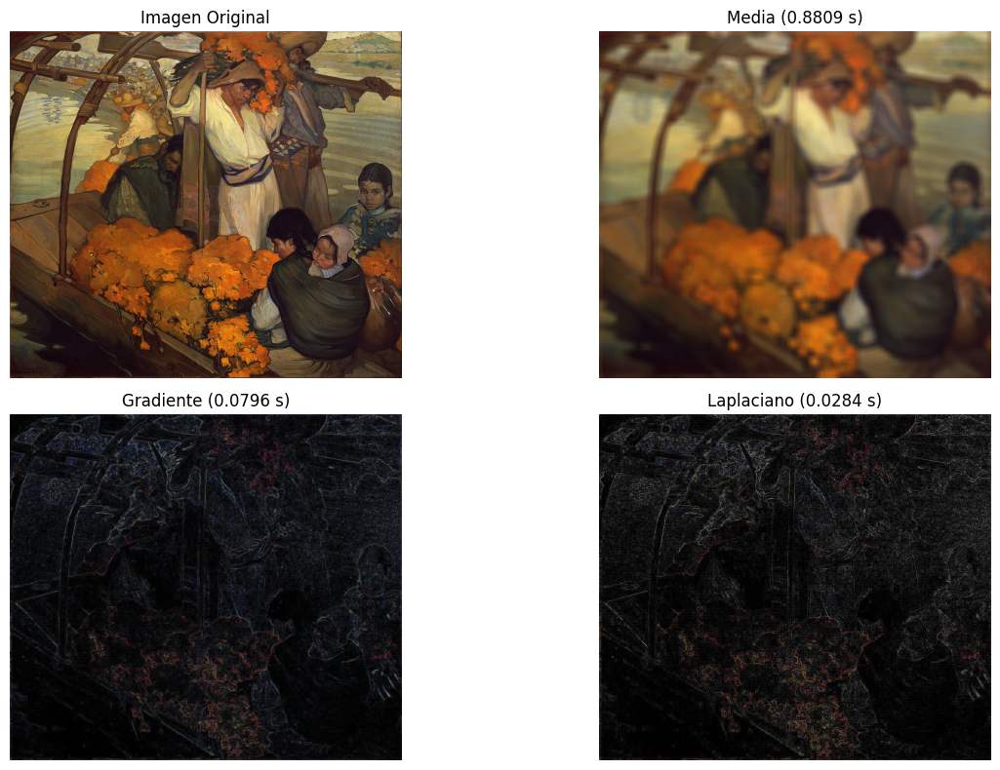

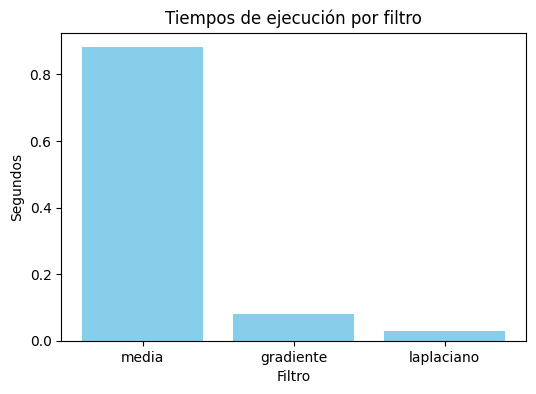

In [ ]:
# ============================================== #
# La Ofrenda (1913) – Saturnino Herrán - COLOR = #
# ============================================== #

FILENAME = "/home/cesar/Natural-Language-Processing-and-Computer-Vision/Visión-Computacional/Tarea-01-Filtros/imagenes/LaOfrenda_Saturnino.jpg"
FILTROS_A_APLICAR = ['media', 'gradiente', 'laplaciano']
HIPERPARAMETROS = {'kernel_size': 20}

original, resultados, tiempos = apply_filters_cpu(
    image_path=FILENAME,
    filter_sequence=FILTROS_A_APLICAR,
    modo_color=True,  # Cambia a True si quieres mantener el color
    **HIPERPARAMETROS
)

mostrar_resultados(original, resultados, tiempos)

-> Aplicando filtro: media
   Tiempo: 1.420965 s
-> Aplicando filtro: gradiente
   Tiempo: 0.277199 s
-> Aplicando filtro: laplaciano
   Tiempo: 0.047578 s


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


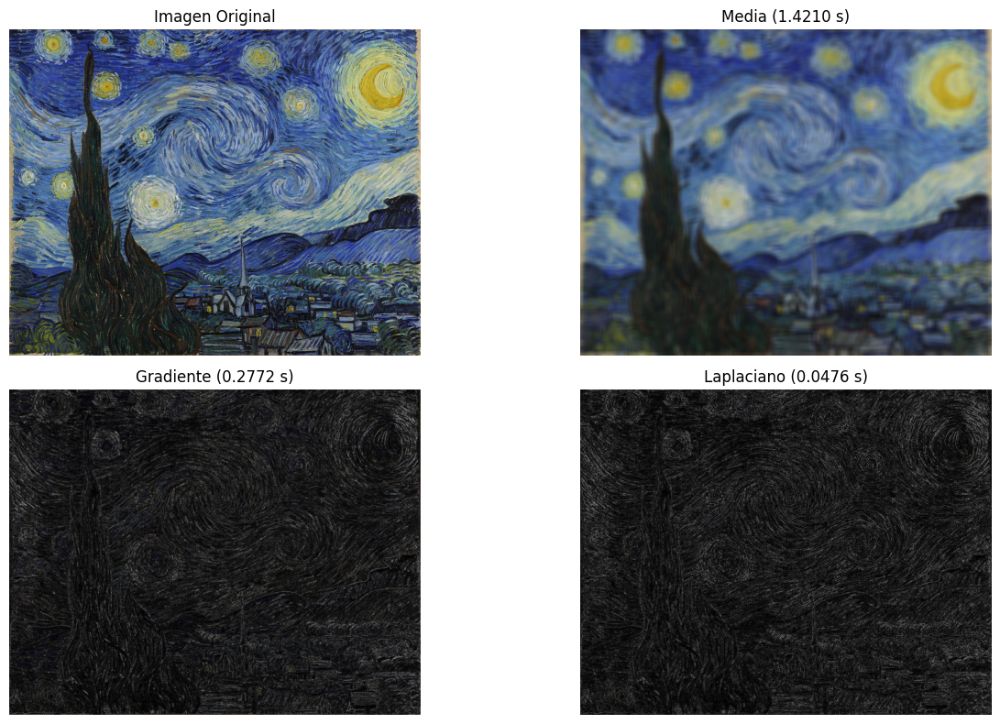

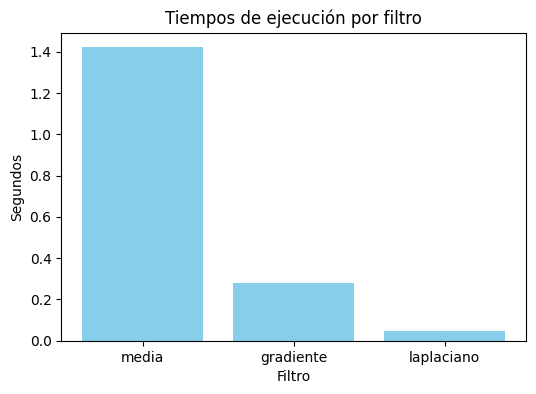

In [2]:
# ============================================== #
# Noche Estrellada I – Vincent Van Gogh - COLOR = #
# ============================================== #

FILENAME = "/home/cesar/Natural-Language-Processing-and-Computer-Vision/Visión-Computacional/Tarea-01-Filtros/imagenes/VanGogh.jpg"
FILTROS_A_APLICAR = ['media', 'gradiente', 'laplaciano']
HIPERPARAMETROS = {'kernel_size': 20}

original, resultados, tiempos = apply_filters_cpu(
    image_path=FILENAME,
    filter_sequence=FILTROS_A_APLICAR,
    modo_color=True,  # Cambia a True si quieres mantener el color
    **HIPERPARAMETROS
)

mostrar_resultados(original, resultados, tiempos)

-> Aplicando filtro: media
   Tiempo: 1.478456 s
-> Aplicando filtro: gradiente
   Tiempo: 0.393322 s
-> Aplicando filtro: laplaciano
   Tiempo: 0.075794 s


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


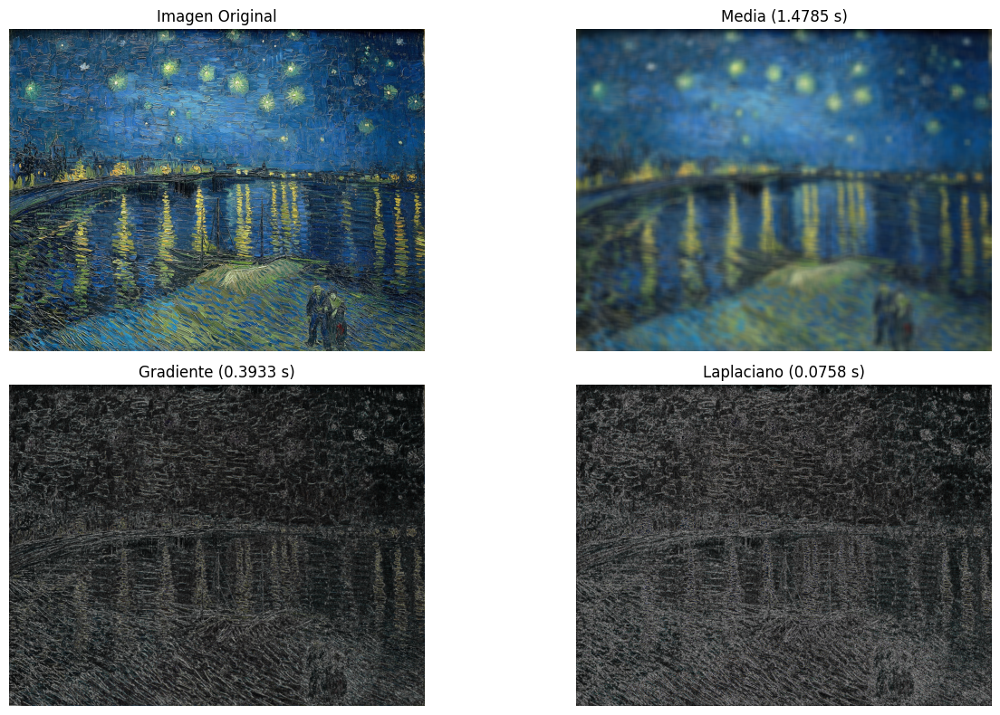

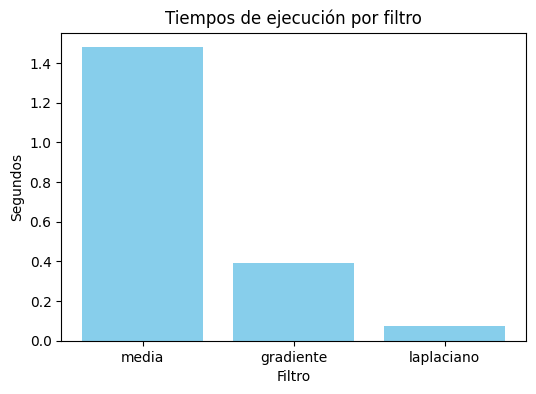

In [3]:
# ============================================== #
# Noche Estrellada II – Vincent Van Gogh - COLOR = #
# ============================================== #

FILENAME = "/home/cesar/Natural-Language-Processing-and-Computer-Vision/Visión-Computacional/Tarea-01-Filtros/imagenes/VanGogh2.jpg"
FILTROS_A_APLICAR = ['media', 'gradiente', 'laplaciano']
HIPERPARAMETROS = {'kernel_size': 20}

original, resultados, tiempos = apply_filters_cpu(
    image_path=FILENAME,
    filter_sequence=FILTROS_A_APLICAR,
    modo_color=True,  # Cambia a True si quieres mantener el color
    **HIPERPARAMETROS
)

mostrar_resultados(original, resultados, tiempos)

-> Aplicando filtro: media
   Tiempo: 4.632273 s
-> Aplicando filtro: gradiente
   Tiempo: 0.789854 s
-> Aplicando filtro: laplaciano
   Tiempo: 0.173988 s


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


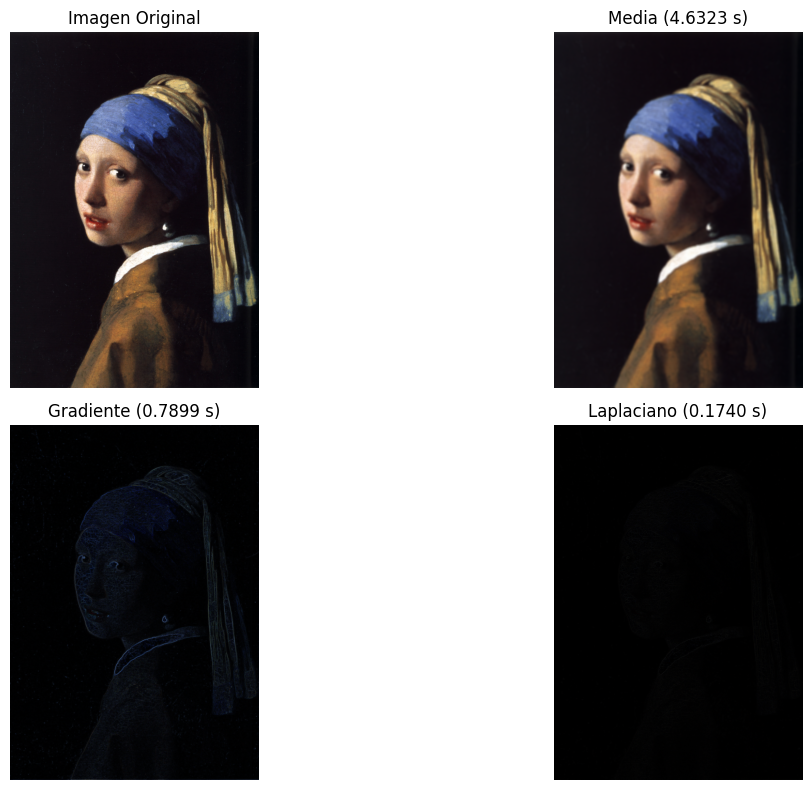

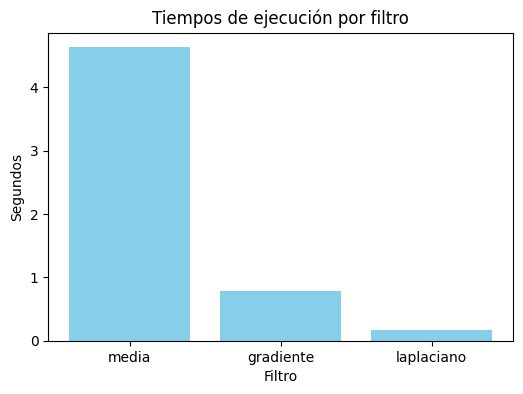

In [2]:
# ============================================== #
# La chica de la Perla (1665) – Johannes Vermeer - COLOR = #
# ============================================== #

FILENAME = "/home/cesar/Natural-Language-Processing-and-Computer-Vision/Visión-Computacional/Tarea-01-Filtros/imagenes/Vermeer.jpg"
FILTROS_A_APLICAR = ['media', 'gradiente', 'laplaciano']
HIPERPARAMETROS = {'kernel_size': 20}

original, resultados, tiempos = apply_filters_cpu(
    image_path=FILENAME,
    filter_sequence=FILTROS_A_APLICAR,
    modo_color=True,  # Cambia a True si quieres mantener el color
    **HIPERPARAMETROS
)

mostrar_resultados(original, resultados, tiempos)

-> Aplicando filtro: media
   Tiempo: 4.644967 s
-> Aplicando filtro: gradiente
   Tiempo: 0.959311 s
-> Aplicando filtro: laplaciano
   Tiempo: 0.176006 s


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


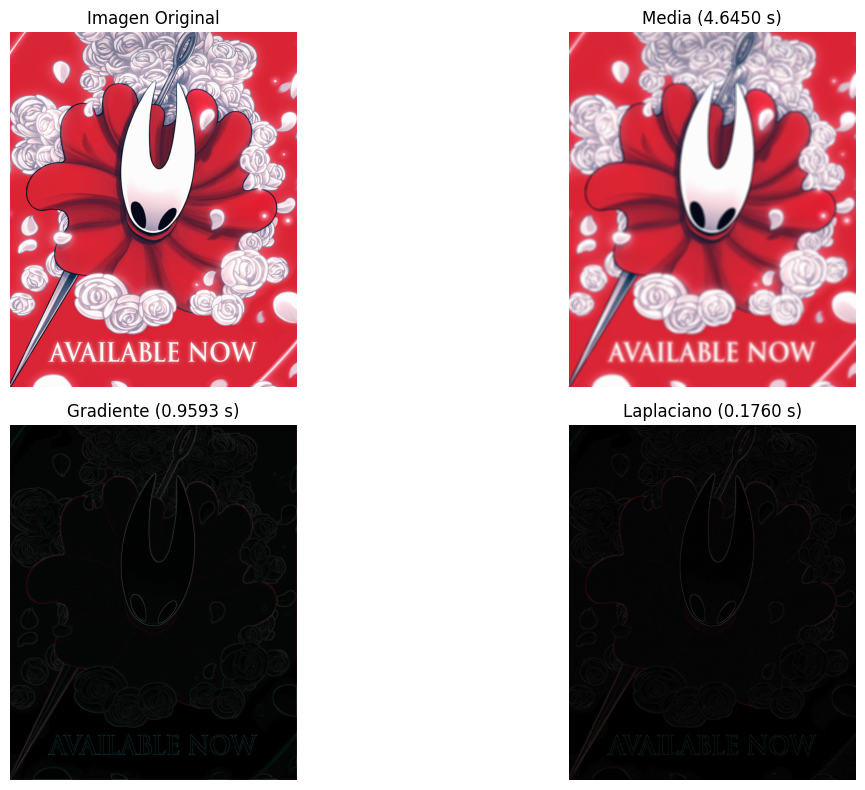

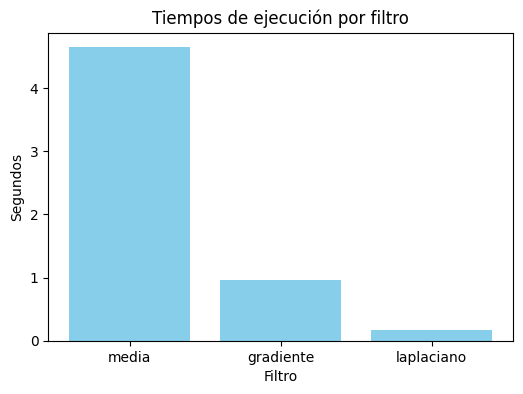

In [2]:
# ===================================================================== #
# Hornet - Silksong - COLOR = #
# ============================================== #

FILENAME = "/home/cesar/Natural-Language-Processing-and-Computer-Vision/Visión-Computacional/Tarea-01-Filtros/imagenes/Silksong.jpeg"
FILTROS_A_APLICAR = ['media', 'gradiente', 'laplaciano']
HIPERPARAMETROS = {'kernel_size': 20}

original, resultados, tiempos = apply_filters_cpu(
    image_path=FILENAME,
    filter_sequence=FILTROS_A_APLICAR,
    modo_color=True,  # Cambia a True si quieres mantener el color
    **HIPERPARAMETROS
)

mostrar_resultados(original, resultados, tiempos)

-> Aplicando filtro: media
   Tiempo: 2.022745 s
-> Aplicando filtro: gradiente
   Tiempo: 0.329262 s
-> Aplicando filtro: laplaciano
   Tiempo: 0.121747 s


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


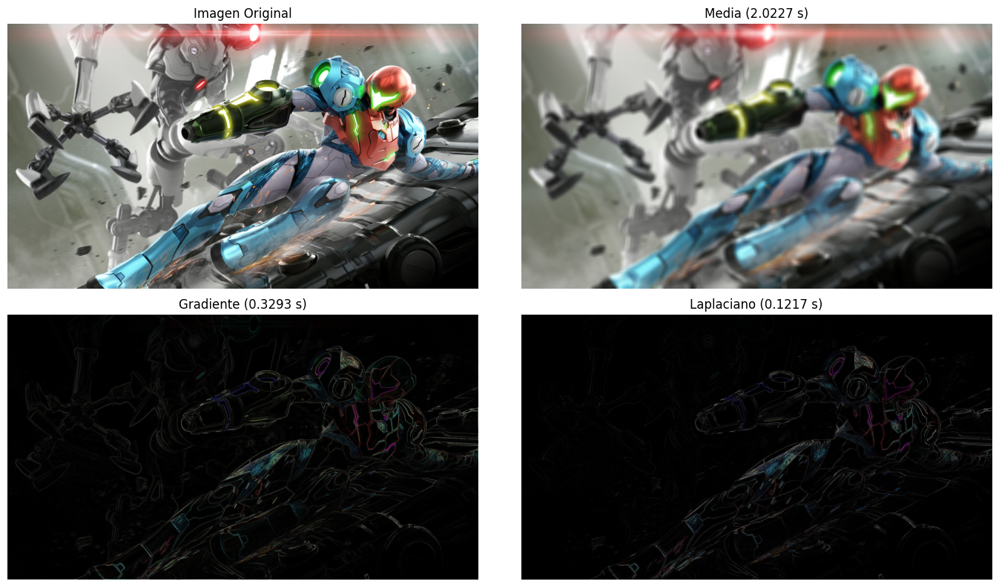

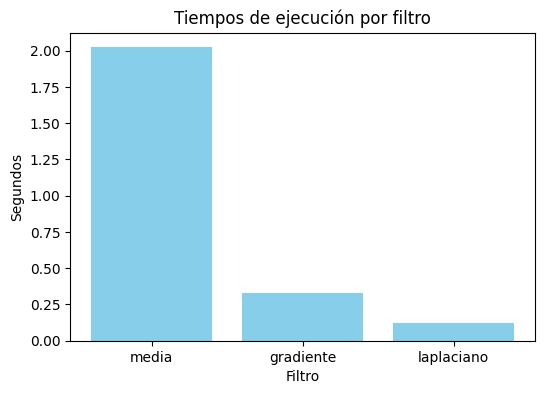

In [ ]:
# ============================================== #
# Samus Aran – Metroid Dread - COLOR = #
# ============================================== #

FILENAME = "/home/cesar/Natural-Language-Processing-and-Computer-Vision/Visión-Computacional/Tarea-01-Filtros/imagenes/samus.jpg"
FILTROS_A_APLICAR = ['media', 'gradiente', 'laplaciano']
HIPERPARAMETROS = {'kernel_size': 20}

original, resultados, tiempos = apply_filters_cpu(
    image_path=FILENAME,
    filter_sequence=FILTROS_A_APLICAR,
    modo_color=True,  # Cambia a True si quieres mantener el color
    **HIPERPARAMETROS
)

mostrar_resultados(original, resultados, tiempos)

### Colores en los filtros de bordes

El código procesa las imagenes por canal cuando se aplica a color:

`np.stack([convolve(imagen[..., c], kernel) for c in range(3)], axis=-1)`

Es decir, se aplica independientemente cada filtro a cada canal RGB. Luego, cada uno de esos tres 
resultados (por canal) se combinan de nuevo para formar una imagen (RGB, valga la redundancia).

Cuando el canal se procesa por separado, el canal rojo puede tener bordes en una zona, el canal verde en otra, y el azul en una distinta. Cada canal tiene un valor distinto para cad apíxel después del filtrado, cuando se recombinan los tres, esas diferencias producen colores artificiales que representa donde cada canal cambia más. Mientras más de un color ne un borde, mayor cambio de ese canal hay en la imagen. 